In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
from google.colab import drive
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import KFold, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import plot_confusion_matrix, confusion_matrix, classification_report
from sklearn import tree
%matplotlib inline
drive.mount('/content/drive')
mpl.style.use('bmh')


Mounted at /content/drive


# **Lectura de archivos**

In [ ]:
# **Read File Credit_Record**
pd_credit_record_initial = pd.read_csv("/content/drive/MyDrive/Desafios- Curso Data Science -Comisión 29825/Desafio 2 Visualizaciones con Python/Tarjeta Credito/credit_record.csv")
pd_credit_record_initial.head()


,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [ ]:
# Read File Application
pd_application_record_initial = pd.read_csv("/content/drive/MyDrive/Desafios- Curso Data Science -Comisión 29825/Desafio 2 Visualizaciones con Python/Tarjeta Credito/application_record.csv")
pd_application_record_initial.head()


,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


# **Exploracion datasets**

## Credit card record


In [ ]:
pd_credit_record_initial.shape


(1048575, 3)

In [ ]:
pd_credit_record_initial.describe()

,ID,MONTHS_BALANCE
count,1.048575e+06,1.048575e+06
mean,5.068286e+06,-1.913700e+01
std,4.615058e+04,1.402350e+01
min,5.001711e+06,-6.000000e+01
25%,5.023644e+06,-2.900000e+01
50%,5.062104e+06,-1.700000e+01
75%,5.113856e+06,-7.000000e+00
max,5.150487e+06,0.000000e+00


In [ ]:
pd_credit_record_initial.dtypes

ID                 int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object

In [ ]:
pd_credit_record_initial.isnull().sum()


ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [ ]:
%pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 22.0 MB 134 kB/s
     |████████████████████████████████| 102 kB 5.3 MB/s 
     |████████████████████████████████| 679 kB 29.8 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 9.9 MB 39.5 MB/s 
     |████████████████████████████████| 4.7 MB 42.6 MB/s 
     |████████████████████████████████| 296 kB 72.5 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-dev-py2.py3-none-any.whl size=324949 sha256=4e52d75b7f373397ccbf9c4e0912d27c1788bb193428e1485ca5a5accde3813f
  Stored in directory: /tmp/pip-ephem-wheel-cache-zfdi7qj6/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=80452cf245775a0c7f17ad1bf8fc9efb91c4bc253977e6be845e85deb18e8b00
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b

In [ ]:
%pip install ipywidgets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.1 MB/s 


In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(pd_credit_record_initial, minimal=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Application record


In [ ]:
pd_application_record_initial.shape


(438557, 18)

In [ ]:
pd_application_record_initial.describe()

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
count,4.385570e+05,438557.000000,4.385570e+05,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.427390,1.875243e+05,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,2.194465
std,5.716370e+05,0.724882,1.100869e+05,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,0.897207
min,5.008804e+06,0.000000,2.610000e+04,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,1.000000
25%,5.609375e+06,0.000000,1.215000e+05,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,2.000000
50%,6.047745e+06,0.000000,1.607805e+05,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,2.000000
75%,6.456971e+06,1.000000,2.250000e+05,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,3.000000
max,7.999952e+06,19.000000,6.750000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000


In [ ]:
pd_application_record_initial.dtypes

ID                       int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN             int64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
DAYS_BIRTH               int64
DAYS_EMPLOYED            int64
FLAG_MOBIL               int64
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS        float64
dtype: object

In [ ]:
pd_application_record_initial.isnull().sum()


ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(pd_application_record_initial, minimal=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#**Limpieza de datos**


In [ ]:
pd_credit_record = pd_credit_record_initial.drop_duplicates(subset=['ID'])
pd_application_record = pd_application_record_initial.drop_duplicates(subset=['ID'])
print(pd_credit_record.shape)
print(pd_application_record.shape)


(45985, 3)
(438510, 18)


## Credit card record

### Cuales son los clientes que estuvieron en mora mayores o iguales a 60 días en los ultimos 5 años?

In [ ]:
print("Numero de clientes en el record de trajetas de credito: {}".format(
    len(pd_credit_record_initial.ID.unique())))
# para verificar si tenemos alguna data perdida
pd_credit_record_charge_off_rate = pd_credit_record_initial.copy()
pd_credit_record_drop = pd_credit_record_charge_off_rate.dropna()
if pd_credit_record_charge_off_rate.shape == pd_credit_record_drop.shape:
    print("No hay data perdida.")
else:
    print("Tenemos {} filas  con data perdida".format(len(
        pd_credit_record_charge_off_rate.ID.unique())-len(pd_credit_record_drop.ID.unique())))

Numero de clientes en el record de trajetas de credito: 45985
No hay data perdida.


In [ ]:
# Agrupnado por ID`s
pd_credit_record_charge_off_rate.sort_values('ID')

# Verificando duplicados
groups_month = pd_credit_record_charge_off_rate.groupby(
    ['ID', 'MONTHS_BALANCE'])
groups_month_count = groups_month.count()
groups_month_count = groups_month_count.rename(columns={"STATUS": "COUNT"})
if groups_month_count.loc[groups_month_count['COUNT'] > 1].empty:
    print("No hay duplicados")
else:
    print("Hay duplicados")


No hay duplicados


In [ ]:
# reshape data by 'ID' based on 'MONTHS_BALANCE'
credit_pivot = pd_credit_record_charge_off_rate.pivot(
    index='ID', columns='MONTHS_BALANCE', values='STATUS')
print(credit_pivot.head())

MONTHS_BALANCE  -60  -59  -58  -57  -56  -55  -54  -53  -52  -51  ...  -9   \
ID                                                                ...        
5001711         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...  NaN   
5001712         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...    0   
5001713         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...    X   
5001714         NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...    X   
5001715         NaN    X    X    X    X    X    X    X    X    X  ...    X   

MONTHS_BALANCE  -8   -7   -6   -5   -4  -3  -2  -1   0   
ID                                                       
5001711         NaN  NaN  NaN  NaN  NaN   0   0   0   X  
5001712           C    C    C    C    C   C   C   C   C  
5001713           X    X    X    X    X   X   X   X   X  
5001714           X    X    X    X    X   X   X   X   X  
5001715           X    X    X    X    X   X   X   X   X  

[5 rows x 61 columns]


In [ ]:
# Asumimos que el ultimo mes esta abierto para realizar pago
# Asumimos que el primer mes esta cerrado para realizar pago
# group pd_credit_record_charge_off_rate  por 'ID' e identificamos el ultimo y el primer mes.
credit_grouped = pd_credit_record_charge_off_rate.groupby('ID')
credit_pivot['open_month'] = credit_grouped['MONTHS_BALANCE'].min()
credit_pivot['close_month'] = credit_grouped['MONTHS_BALANCE'].max()
credit_pivot['ID'] = credit_pivot.index
credit_pivot = credit_pivot[['ID', 'open_month', 'close_month']]
credit_pivot.reset_index(drop=True, inplace=True)
credit_pivot["window_month"] = credit_pivot['close_month'] - \
    credit_pivot['open_month']
# merge ambos df
credit = pd.merge(pd_credit_record_charge_off_rate,
                  credit_pivot, how='left', on='ID')
# Meses en el balance
credit['MOB'] = credit['MONTHS_BALANCE']-credit['open_month']
credit.sort_values(['ID', 'MOB'], inplace=True)

# Divido por 48 para llevarlo a 4 years
bins = [k for k in range(-61, 1, 12)]
credit['open_year'] = pd.cut(
    credit['open_month'], bins, labels=[-5, -4, -3, -2, -1])  # open_year_to_today

credit0 = credit
credit0.head()


<ipython-input-21-9a6be9402781>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  credit_pivot["window_month"] = credit_pivot['close_month'] - \


,ID,MONTHS_BALANCE,STATUS,open_month,close_month,window_month,MOB,open_year
3,5001711,-3,0,-3,0,3,0,-1
2,5001711,-2,0,-3,0,3,1,-1
1,5001711,-1,0,-3,0,3,2,-1
0,5001711,0,X,-3,0,3,3,-1
22,5001712,-18,0,-18,0,18,0,-2


In [ ]:

# un cliente sera considerado como "malo" 'bad' (1) si ha tenido mora mayores o iguales 60 dias en los ultimos cinco años
credit['overdue'] = np.where( (credit['STATUS'] == '1') | (credit['STATUS'] == '2') | (credit['STATUS'] == '3') | (credit['STATUS'] == '4') | (credit['STATUS'] == '5' ), 1, 0)

df_mask= credit['overdue']== 1

Bad_cliente_df =credit[df_mask ]
Bad_cliente_df.drop_duplicates(subset=['ID'])


,ID,MONTHS_BALANCE,STATUS,open_month,close_month,window_month,MOB,open_year,overdue
154,5001718,-12,1,-38,0,38,26,-4,1
239,5001720,-15,1,-35,0,35,20,-3,1
918,5001757,-3,1,-20,0,20,17,-2,1
1490,5001786,-38,1,-58,0,58,20,-5,1
1630,5001792,-8,1,-24,0,24,16,-2,1
...,...,...,...,...,...,...,...,...,...
1047846,5150412,-9,1,-17,0,17,8,-2,1
1047963,5150417,-30,1,-37,-11,26,7,-4,1
1048173,5150459,-43,1,-51,0,51,8,-5,1
1048223,5150463,-2,1,-10,0,10,8,-1,1


In [ ]:
N = len(pd_credit_record)

for i in range(N):
    if pd_credit_record.iloc[i, 0] in Bad_cliente_df.ID.values:
        pd_credit_record.iloc[i, 2] = 1
    else:
        pd_credit_record.iloc[i, 2] = 0


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
pd_credit_record.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,0
4,5001712,0,0
23,5001713,0,0
45,5001714,0,0
60,5001715,0,0


In [ ]:
merge_record = pd.merge(pd_credit_record, pd_application_record, on=["ID"])
merge_record.sort_values("ID", inplace=True)
merge_record['DAYS_BIRTH'] = merge_record['DAYS_BIRTH']/-365
merge_record.rename(columns={'DAYS_BIRTH':"AGE"}, inplace=True)

merge_record['DAYS_EMPLOYED'] = merge_record['DAYS_EMPLOYED']/-365
merge_record.rename(columns={'DAYS_EMPLOYED':"YEARS_EMPLOYED"}, inplace=True)

merge_record.head()

,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,0,1,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,32.890411,12.443836,1,1,0,0,NaN,2.0
1,5008805,0,1,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,32.890411,12.443836,1,1,0,0,NaN,2.0
2,5008806,0,0,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,58.832877,3.106849,1,0,0,0,Security staff,2.0
3,5008808,0,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
4,5008809,-22,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0


In [ ]:
merge_record.shape

(36457, 20)

In [ ]:
merge_record.describe()

,ID,MONTHS_BALANCE,CNT_CHILDREN,AMT_INCOME_TOTAL,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
count,3.645700e+04,36457.000000,36457.000000,3.645700e+04,36457.000000,36457.000000,36457.0,36457.000000,36457.000000,36457.000000,36457.000000
mean,5.078227e+06,-5.831802,0.430315,1.866857e+05,43.767598,-162.364207,1.0,0.225526,0.294813,0.089722,2.198453
std,4.187524e+04,11.326494,0.742367,1.017892e+05,11.508356,377.126945,0.0,0.417934,0.455965,0.285787,0.911686
min,5.008804e+06,-60.000000,0.000000,2.700000e+04,20.517808,-1000.665753,1.0,0.000000,0.000000,0.000000,1.000000
25%,5.042028e+06,-6.000000,0.000000,1.215000e+05,34.142466,1.117808,1.0,0.000000,0.000000,0.000000,2.000000
50%,5.074614e+06,0.000000,0.000000,1.575000e+05,42.638356,4.252055,1.0,0.000000,0.000000,0.000000,2.000000
75%,5.115396e+06,0.000000,1.000000,2.250000e+05,53.254795,8.638356,1.0,0.000000,1.000000,0.000000,3.000000
max,5.150487e+06,0.000000,19.000000,1.575000e+06,68.909589,43.049315,1.0,1.000000,1.000000,1.000000,20.000000


# **Reducción de la dimensionalidad del dataset**

## Identificando Outliers

In [ ]:
l=[x for x in merge_record.columns if x not in ["ID", "MONTHS_BALANCE",	"STATUS", "CODE_GENDER", "FLAG_OWN_CAR","FLAG_OWN_REALTY","DAYS_EMPLOYED", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE",	"NAME_FAMILY_STATUS",	"NAME_HOUSING_TYPE", "FLAG_MOBIL", "FLAG_WORK_PHONE", "FLAG_PHONE", "FLAG_EMAIL", "OCCUPATION_TYPE", "CNT_FAM_MEMBERS"]]
agg_merge_record= merge_record[l]
agg_merge_record

,CNT_CHILDREN,AMT_INCOME_TOTAL,AGE,YEARS_EMPLOYED
0,0,427500.0,32.890411,12.443836
1,0,427500.0,32.890411,12.443836
2,0,112500.0,58.832877,3.106849
3,0,270000.0,52.356164,8.358904
4,0,270000.0,52.356164,8.358904
...,...,...,...,...
36452,1,157500.0,29.610959,4.764384
36453,1,157500.0,29.610959,4.764384
36454,1,157500.0,29.610959,4.764384
36455,1,157500.0,29.610959,4.764384


In [ ]:
for i,j in zip(range(3),agg_merge_record.columns):
  fig=px.box(agg_merge_record.columns, x=agg_merge_record[j], title = str(agg_merge_record[j].name), height=400)
  fig.show()


In [ ]:
def outliers(df,ft):
  Q1=df[ft].quantile(0.25)
  Q3=df[ft].quantile(0.75)
  IQR = Q3 - Q1

  frontera_inferior=Q1 -1.5*IQR
  frontera_superior=Q3 +1.5*IQR

  ls = df.index[(df[ft] < frontera_inferior) | (df[ft] > frontera_superior )]

  return ls


In [ ]:
index_list=[]
for column in ["AMT_INCOME_TOTAL","AGE","CNT_CHILDREN","YEARS_EMPLOYED"]:
  index_list.extend(outliers(agg_merge_record,column))

print("Se identiticaron ",len(index_list),"Outliers")

Se identiticaron  9942 Outliers


## Removiendo Outliers

In [ ]:
def remover_outliers (df, ls):
  ls = sorted(set(ls))
  df = df.drop(ls)
  return df

In [ ]:
merge_cleaned = remover_outliers(merge_record, index_list)
merge_cleaned


,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,5008806,0,0,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,58.832877,3.106849,1,0,0,0,Security staff,2.0
3,5008808,0,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
4,5008809,-22,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
5,5008810,0,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
6,5008811,0,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36452,5150482,-11,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36453,5150483,0,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36454,5150484,0,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36455,5150485,0,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0


In [ ]:
l=[x for x in merge_cleaned.columns if x not in ["ID", "MONTHS_BALANCE",	"STATUS", "CODE_GENDER", "FLAG_OWN_CAR","FLAG_OWN_REALTY","DAYS_EMPLOYED", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE",	"NAME_FAMILY_STATUS",	"NAME_HOUSING_TYPE", "FLAG_MOBIL", "FLAG_WORK_PHONE", "FLAG_PHONE", "FLAG_EMAIL", "OCCUPATION_TYPE", "CNT_FAM_MEMBERS"]]
agg_merge_record_test= merge_cleaned[l]
agg_merge_record_test

,CNT_CHILDREN,AMT_INCOME_TOTAL,AGE,YEARS_EMPLOYED
2,0,112500.0,58.832877,3.106849
3,0,270000.0,52.356164,8.358904
4,0,270000.0,52.356164,8.358904
5,0,270000.0,52.356164,8.358904
6,0,270000.0,52.356164,8.358904
...,...,...,...,...
36452,1,157500.0,29.610959,4.764384
36453,1,157500.0,29.610959,4.764384
36454,1,157500.0,29.610959,4.764384
36455,1,157500.0,29.610959,4.764384


In [ ]:
#plt.figure(figsize=(13,11))
for i,j in zip(range(3),agg_merge_record_test):
  fig=px.box(agg_merge_record_test, x=agg_merge_record_test[j], title = str(agg_merge_record_test[j].name), height=400)
  fig.show()
  #plt.subplot(4,2,i+1)
  #sns.boxplot(x=agg_merge_record_test[j])
  #plt.title(j)
  #plt.xlabel('')

Debido a la poca variabilidad de los datos en la cantidad de hijos (mayormente 0 o 1), se genera una division importante en el arbol de decisiones ya que son 2 extremos que hacen una gran diferencia en la economia de un cliente.

In [ ]:
merge_cleaned.drop(
    ["MONTHS_BALANCE"], axis=1, inplace=True)
merge_cleaned['STATUS'] = merge_cleaned['STATUS'].astype('int64')
merge_cleaned.head()

,ID,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,5008806,0,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,58.832877,3.106849,1,0,0,0,Security staff,2.0
3,5008808,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
4,5008809,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
5,5008810,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
6,5008811,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0


In [ ]:
merge_cleaned.dtypes

ID                       int64
STATUS                   int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN             int64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
AGE                    float64
YEARS_EMPLOYED         float64
FLAG_MOBIL               int64
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS        float64
dtype: object

## Verificar tamaño

In [ ]:
merge_cleaned["STATUS"].value_counts()

0    23505
1     3198
Name: STATUS, dtype: int64

En base a esta información es posible verificar que existe una diferencia de 7.5 entre la cantidad de muestra entre el estatus 0 y el 1.
Esto es necesario considerar porque se generará un peso de esta diferencia para la clase 1 en el arbol de decision.

# **Obtención de insights**

##Análisis Univariado

In [ ]:
Num_variables = ["CNT_CHILDREN","AMT_INCOME_TOTAL","AGE",	"YEARS_EMPLOYED", "CNT_FAM_MEMBERS"]

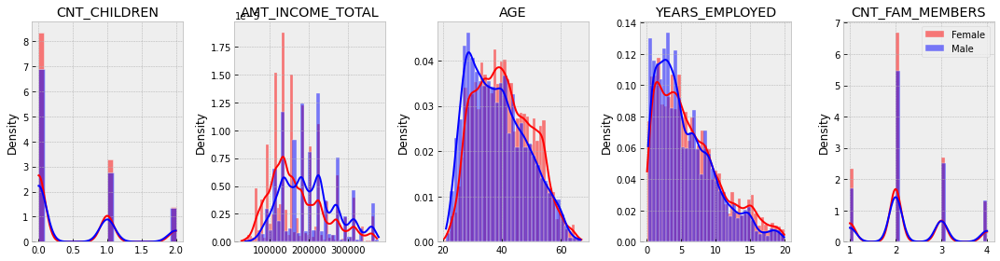

In [ ]:
columns = 5
fig, axes = plt.subplots(len(Num_variables) // columns,
                         columns, squeeze=False, figsize=(15, 4))

F = merge_cleaned[merge_cleaned['CODE_GENDER'] == "F"]
M = merge_cleaned[merge_cleaned['CODE_GENDER'] == "M"]

for current_idx, variable in enumerate(Num_variables):
    i = current_idx // columns  # Filas
    j = current_idx % columns  # Columnas

    sns.histplot(F[variable], label='Female', ax=axes[i]
                 [j], stat="density", color="red", kde=True)
    sns.histplot(M[variable], label='Male', ax=axes[i]
                 [j], stat="density", color="blue", kde=True)

    axes[i][j].set_title(variable)
    axes[i][j].set_xlabel("")

plt.tight_layout()
plt.legend()
plt.show()


### Tiene impacto en la aprobación de TDC el nivel academico de los solicitantes?

In [ ]:
record_approved = merge_cleaned["STATUS"] == 0
merge_record_approved =merge_cleaned[record_approved]
merge_record_approved

,ID,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,5008806,0,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,58.832877,3.106849,1,0,0,0,Security staff,2.0
3,5008808,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
4,5008809,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
5,5008810,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
6,5008811,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36452,5150482,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36453,5150483,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36454,5150484,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0
36455,5150485,0,F,Y,Y,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,29.610959,4.764384,1,0,0,0,Core staff,3.0


In [ ]:
# Dataframe record_EDUCATION_TOTAL
pd_application_record_EDUCATION = merge_cleaned.groupby(
    ["NAME_EDUCATION_TYPE"]).size().reset_index(name="COUNT")
pd_application_record_EDUCATION_percentage = pd_application_record_EDUCATION.assign(
    PERCETANGE=pd_application_record_EDUCATION[["COUNT"]] / len(merge_record)*100)
pd_application_record_EDUCATION_percentage

,NAME_EDUCATION_TYPE,COUNT,PERCETANGE
0,Academic degree,28,0.076803
1,Higher education,7548,20.703843
2,Incomplete higher,1220,3.346408
3,Lower secondary,209,0.573278
4,Secondary / secondary special,17698,48.544861


In [ ]:
# Dataframe record_EDUCATION_APPROVED
pd_application_record_EDUCATION_APPROVED = merge_record_approved.groupby(
    ["NAME_EDUCATION_TYPE"]).size().reset_index(name="COUNT")
pd_application_record_EDUCATION_APPROVED_percentage = pd_application_record_EDUCATION_APPROVED.assign(
    PERCETANGE=pd_application_record_EDUCATION_APPROVED[["COUNT"]] / len(merge_record_approved)*100)
pd_application_record_EDUCATION_APPROVED_percentage

,NAME_EDUCATION_TYPE,COUNT,PERCETANGE
0,Academic degree,22,0.093597
1,Higher education,6689,28.457775
2,Incomplete higher,1045,4.445863
3,Lower secondary,180,0.765795
4,Secondary / secondary special,15569,66.236971


In [ ]:
# Subplot comparando Solicitados vs aprobados
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

labels = list(pd_application_record_EDUCATION_percentage["NAME_EDUCATION_TYPE"])

fig.add_trace(go.Pie(labels=labels, values=list(pd_application_record_EDUCATION_percentage["COUNT"]) , pull=[0.2, 0.2, 0.2, 0.2]), 1, 1)

fig.add_trace(go.Pie(labels=labels, values=list(pd_application_record_EDUCATION_APPROVED_percentage["COUNT"]) ,  pull=[0.2, 0.2, 0.2, 0.2]),
              1, 2)

# Creando grafico tipo dona
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Nivel academico",
# Sumando anotaciones
    annotations=[dict(text='Solicitantes', x=0.17, y=0.5, font_size=15, showarrow=False),
                 dict(text='Aprobados', x=0.83, y=0.5, font_size=15, showarrow=False)])


fig.show()

**Interpretación de los resultados**

Con respecto al total de los solicitantes y de quienes recibieron una tarjeta de credito, se observa que mas de la mitad cuentan con la secundaria completa y mas de un cuarto cuenta con educaciòn superior culminada. Con lo cual mas del 95% cuentan nivel educativo alto o medio y no se observa incidencia del nivel educativo en el otorgamiento de dicha tarjeta. Dado que se mantiene las proporciones en ambas poblaciones. Con lo cual se demuestra que esta variable no impacta la aprobación de la TDC.

## Análisis Bivariado

<Figure size 432x288 with 0 Axes>

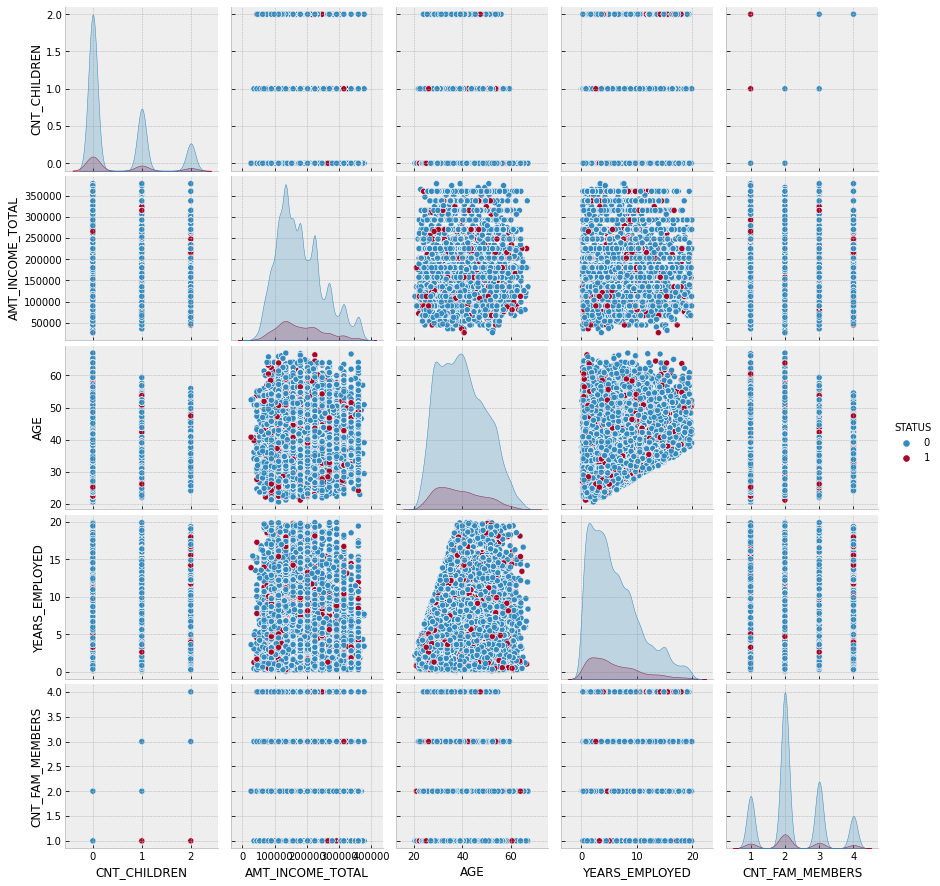

In [ ]:
plt.figure()
Num_Gen_var = Num_variables.copy()
Num_Gen_var.append('STATUS')

sns.pairplot(merge_cleaned[Num_Gen_var]  ,hue = 'STATUS', hue_order =[0, 1])#,palette = 'plasma')

plt.show()

### ¿Cual es la correlacion entre el estado civil de los clientes y la tasa de aprovacion de tarjetas de credito?

In [ ]:
status_Family_Status_Join = pd.concat([merge_cleaned["NAME_FAMILY_STATUS"], merge_record["STATUS"]],
                                      axis=1)
countRows = status_Family_Status_Join.shape[0]
status_Family_Status_Join.index = np.arange(countRows)

mapped = status_Family_Status_Join.groupby(
    ["NAME_FAMILY_STATUS", "STATUS"]).size().reset_index(name="COUNT")
mapped.head()

,NAME_FAMILY_STATUS,STATUS,COUNT
0,Civil marriage,0,2080
1,Civil marriage,1,295
2,Married,0,16290
3,Married,1,2200
4,Separated,0,1341


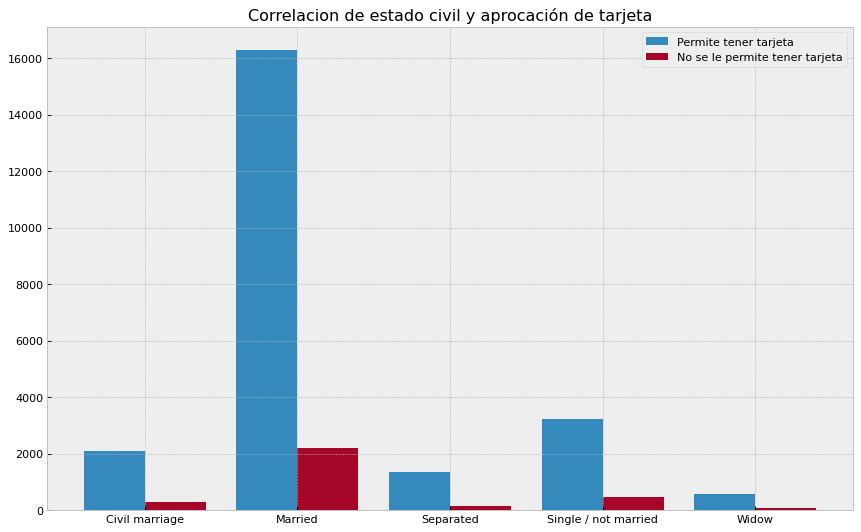

In [ ]:
mappped_Pivoted = mapped.pivot(
    index="STATUS", columns="NAME_FAMILY_STATUS", values="COUNT")

status0 = []
status1 = []
columnsValues = mappped_Pivoted.columns.values
figure(figsize=(13, 8), dpi=80)

for valueSts in columnsValues:
    status0.append(mappped_Pivoted[valueSts][0])
    status1.append(mappped_Pivoted[valueSts][1])

x_axis = np.arange(len(columnsValues))

# Multi bar Chart

plt.bar(x_axis - 0.2, status0, width=0.4, label='Permite tener tarjeta')
plt.bar(x_axis + 0.2, status1, width=0.4,
        label='No se le permite tener tarjeta')

plt.xticks(x_axis, columnsValues)

# Add legend
plt.legend()

# Add title
plt.title("Correlacion de estado civil y aprocación de tarjeta")

# Modify Font
plt.rcParams.update({'font.size': 8})

# Display
plt.show()


**Interpretación de los resultados**

De este gráfico es posible interpretar que existe una gran afluencia de las personas que están casadas y que desean poseer una tarjeta de crédito; pero además no es posible concluir que existe alguna tendencia respecto al estado cívil de las personas que indique que se le otorgará con mayor probabilidad su tarjeta de crédito.

###¿Cual es la distribucion de las edades de los clientes que solicitan tarjetas de credito?

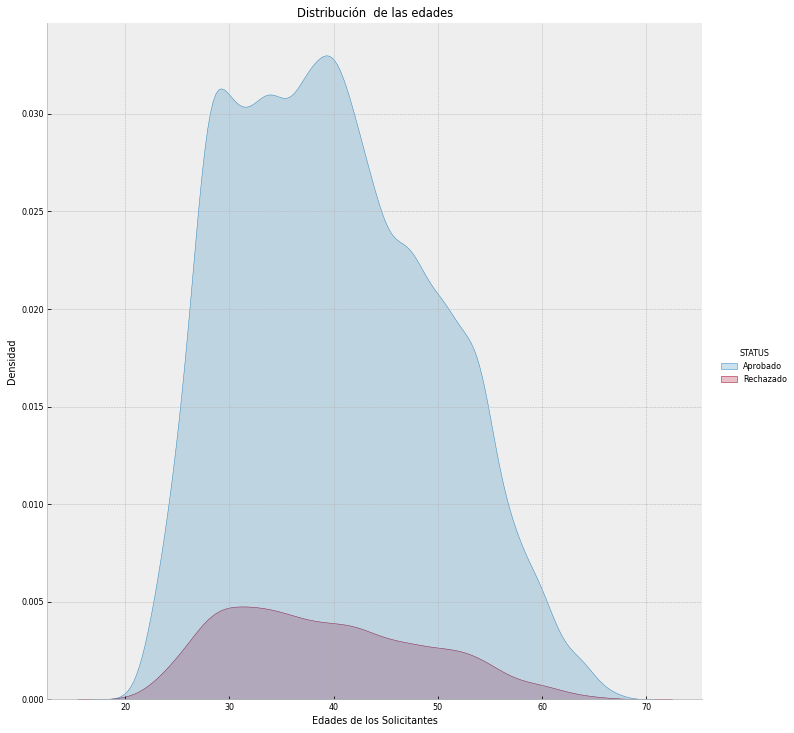

In [ ]:
# Distribución de edad
merge_record_change_value_status = merge_cleaned.copy()
merge_record_change_value_status["STATUS"] = np.where(merge_record_change_value_status["STATUS"] == 0, "Aprobado", "Rechazado")
ax = sns.displot(data=merge_record_change_value_status,x='AGE', kind='kde', hue='STATUS', fill=True, height=10)
ax.set(xlabel='Edades de los Solicitantes',
       ylabel='Densidad', title='Distribución  de las edades')

**Interpretación de los resultados**

La distribución de los aprobados es del tipo leptokurtica con inclinación negativa. En la misma se observa un pico entre la edades de 35 y 45 años. Por otro lado la distribución de los rechazados es del tipo mesokurtica. En conclusión la edad es un factor que indice en la aprobación de las TDC, siendo los mas jovenes quienes cuentan con mayor tasa de aprobación. 


###¿cuales edades y sexos presentan mayores ingresos?

In [ ]:
fig = px.histogram(merge_cleaned, x="AGE", y="AMT_INCOME_TOTAL", color="CODE_GENDER", marginal="box",
                   hover_data=merge_cleaned.columns)
fig.show()

**Interpretación de los resultados**

En general el nivel de ingreso de las mujeres es mayor que los hombres y en ambos sexos dicho nivel disminuye a medida que avanza la edad. Lo cual se relaciona con el grafico anterior, donde los mas jovenes cuentan con una mayor tasa de aprobacion. 

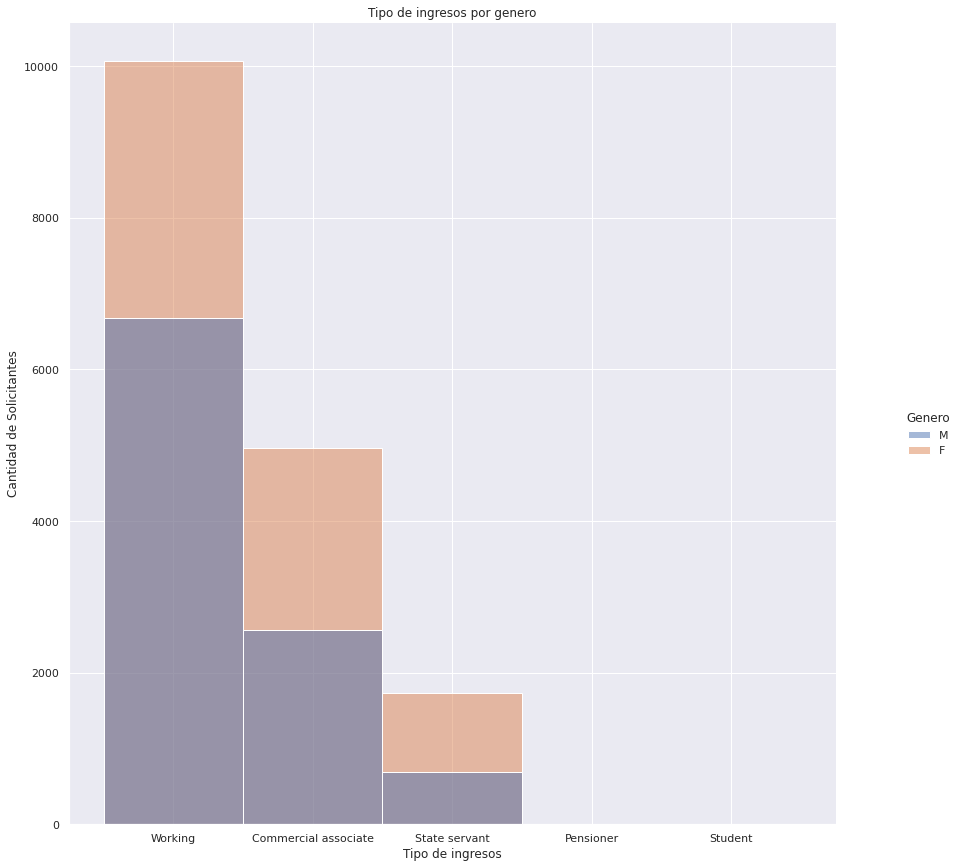

In [ ]:
#  Grafico de ingresos
sns.set(font_scale=1)
ax = sns.displot(data=merge_cleaned, x="NAME_INCOME_TYPE",
                 hue="CODE_GENDER", height=12)
ax.set(xlabel='Tipo de ingresos', ylabel='Cantidad de Solicitantes',
       title="Tipo de ingresos por genero")
ax.legend.set_title("Genero")


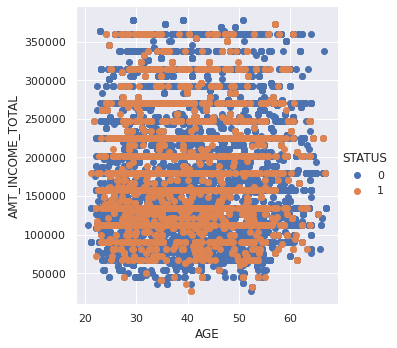

In [ ]:
sns.FacetGrid(merge_cleaned, hue='STATUS', height=5).map(
    plt.scatter, 'AGE', 'AMT_INCOME_TOTAL').add_legend()
plt.show()


## Analisis Multivariado


### 1 - ¿Cuál es el nivel de correlación entre las variables?


Se procede a borrar datos con lo que no se trabajará


In [ ]:
corr_merge_record = merge_cleaned.copy()
corr_merge_record.drop(["ID"], axis=1, inplace=True)
corr_merge_record.head()


,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,0,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,58.832877,3.106849,1,0,0,0,Security staff,2.0
3,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
4,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
5,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0
6,0,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52.356164,8.358904,1,0,1,1,Sales staff,1.0


### Normalizando


Se comenzarrá a verificar la correlación que existe entre las variables, para esto será necesario normalizar la información respecto a un valor número, con la idea que los valores categoricos, puedan ser numéricos.


In [ ]:
def changeNameEducation(e):
    if e == "Higher education":
        return 0
    elif e == "Secondary / secondary special":
        return 1
    elif e == 'Incomplete higher':
        return 2
    elif e == 'Lower secondary':
        return 3
    elif e == 'Academic degree':
        return 4
    else:
        return 5


def changeNameIncomeType(e):
    if e == "Working":
        return 0
    elif e == "Commercial associate":
        return 1
    elif e == 'Pensioner':
        return 2
    elif e == 'State servant':
        return 3
    else:
        return 4


def changFamilyStatus(e):
    if e == "Civil marriage":
        return 0
    elif e == "Married":
        return 1
    elif e == 'Single / not married':
        return 2
    elif e == 'Separated':
        return 3
    elif e == 'Widow':
        return 4
    else:
        return 5


def changHousingType(e):
    if e == "Rented apartment":
        return 0
    elif e == "House / apartment":
        return 1
    elif e == 'Municipal apartment':
        return 2
    elif e == 'With parents':
        return 3
    elif e == 'Co-op apartment':
        return 4
    elif e == 'Office apartment':
        return 5
    else:
        return 6


def changOccupationType(e):
    if e == "Security staff":
        return 0
    elif e == "Sales staff":
        return 1
    elif e == 'Accountants':
        return 2
    elif e == 'Laborers':
        return 3
    elif e == 'Managers':
        return 4
    elif e == 'Drivers':
        return 5
    elif e == 'Core staff':
        return 6
    elif e == 'High skill tech staff':
        return 7
    elif e == 'Cleaning staff':
        return 8
    elif e == 'Private service staff':
        return 9
    elif e == 'Cooking staff':
        return 10
    elif e == 'Low-skill Laborers':
        return 11
    elif e == 'Medicine staff':
        return 12
    elif e == 'Low-skill Laborer':
        return 13
    elif e == 'Secretaries':
        return 14
    elif e == 'Waiters/barmen staff':
        return 15
    elif e == 'HR staff':
        return 16
    elif e == 'Realty agents':
        return 17
    elif e == 'IT staff':
        return 18
    else:
        return 19


def changeCodeGender(dataIn):
    if dataIn == "F":
        return 0
    elif dataIn == "M":
        return 1


def changeOwnCar(dataIn):
    if dataIn == "Y":
        return 0
    elif dataIn == "N":
        return 1


def changeOwnRealty(dataIn):
    if dataIn == "Y":
        return 0
    elif dataIn == "N":
        return 1


In [ ]:
corr_merge_record['NAME_EDUCATION_TYPE'] = corr_merge_record['NAME_EDUCATION_TYPE'].apply(
    lambda x: changeNameEducation(x))
corr_merge_record["NAME_EDUCATION_TYPE"].unique()


array([1, 0, 2, 3, 4])

In [ ]:
corr_merge_record['NAME_INCOME_TYPE'] = corr_merge_record['NAME_INCOME_TYPE'].apply(
    lambda x: changeNameIncomeType(x))
corr_merge_record["NAME_INCOME_TYPE"].unique()


array([0, 1, 3, 2, 4])

In [ ]:
corr_merge_record['NAME_FAMILY_STATUS'] = corr_merge_record['NAME_FAMILY_STATUS'].apply(
    lambda x: changFamilyStatus(x))
corr_merge_record["NAME_FAMILY_STATUS"].unique()


array([1, 2, 0, 3, 4])

In [ ]:
corr_merge_record['NAME_HOUSING_TYPE'] = corr_merge_record['NAME_HOUSING_TYPE'].apply(
    lambda x: changHousingType(x))
corr_merge_record["NAME_HOUSING_TYPE"].unique()


array([1, 0, 2, 3, 4, 5])

In [ ]:
corr_merge_record['OCCUPATION_TYPE'] = corr_merge_record['OCCUPATION_TYPE'].apply(
    lambda x: changOccupationType(x))
corr_merge_record["OCCUPATION_TYPE"].unique()


array([ 0,  1,  2,  3, 19,  5,  6,  4,  7,  8,  9, 10, 11, 12, 14, 15, 16,
       17, 18])

In [ ]:
corr_merge_record['CODE_GENDER'] = corr_merge_record['CODE_GENDER'].apply(
    lambda x: changeCodeGender(x))
corr_merge_record["CODE_GENDER"].unique()


array([1, 0])

In [ ]:
corr_merge_record['FLAG_OWN_CAR'] = corr_merge_record['FLAG_OWN_CAR'].apply(
    lambda x: changeOwnCar(x))
corr_merge_record["FLAG_OWN_CAR"].unique()


array([0, 1])

In [ ]:
corr_merge_record['FLAG_OWN_REALTY'] = corr_merge_record['FLAG_OWN_REALTY'].apply(
    lambda x: changeOwnRealty(x))
corr_merge_record["FLAG_OWN_REALTY"].unique()


array([0, 1])

In [ ]:
corr_merge_record.head()


,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,0,1,0,0,0,112500.0,0,1,1,1,58.832877,3.106849,1,0,0,0,0,2.0
3,0,0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
4,0,0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
5,0,0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
6,0,0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0


In [ ]:
corr_merge_record.corr()["STATUS"]

STATUS                 1.000000e+00
CODE_GENDER            1.392995e-02
FLAG_OWN_CAR           1.898374e-02
FLAG_OWN_REALTY        2.789767e-02
CNT_CHILDREN          -2.435205e-04
AMT_INCOME_TOTAL       7.339470e-03
NAME_INCOME_TYPE       1.833062e-02
NAME_EDUCATION_TYPE    1.825334e-02
NAME_FAMILY_STATUS    -5.718613e-03
NAME_HOUSING_TYPE      4.794411e-03
AGE                   -2.415879e-02
YEARS_EMPLOYED        -1.167243e-02
FLAG_MOBIL                      NaN
FLAG_WORK_PHONE       -9.379074e-03
FLAG_PHONE            -1.163113e-03
FLAG_EMAIL             1.378499e-02
OCCUPATION_TYPE       -8.898961e-03
CNT_FAM_MEMBERS       -4.353321e-07
Name: STATUS, dtype: float64

| Pearson’s r Value | Correlation Between x and y          |
| ----------------- | ------------------------------------ |
| equal to 1        | perfect positive linear relationship |
| greater than 0    | positive correlation                 |
| equal to 0        | no linear relationship               |
| less than 0       | negative correlation                 |
| equal to -1       | perfect negative linear relationship |


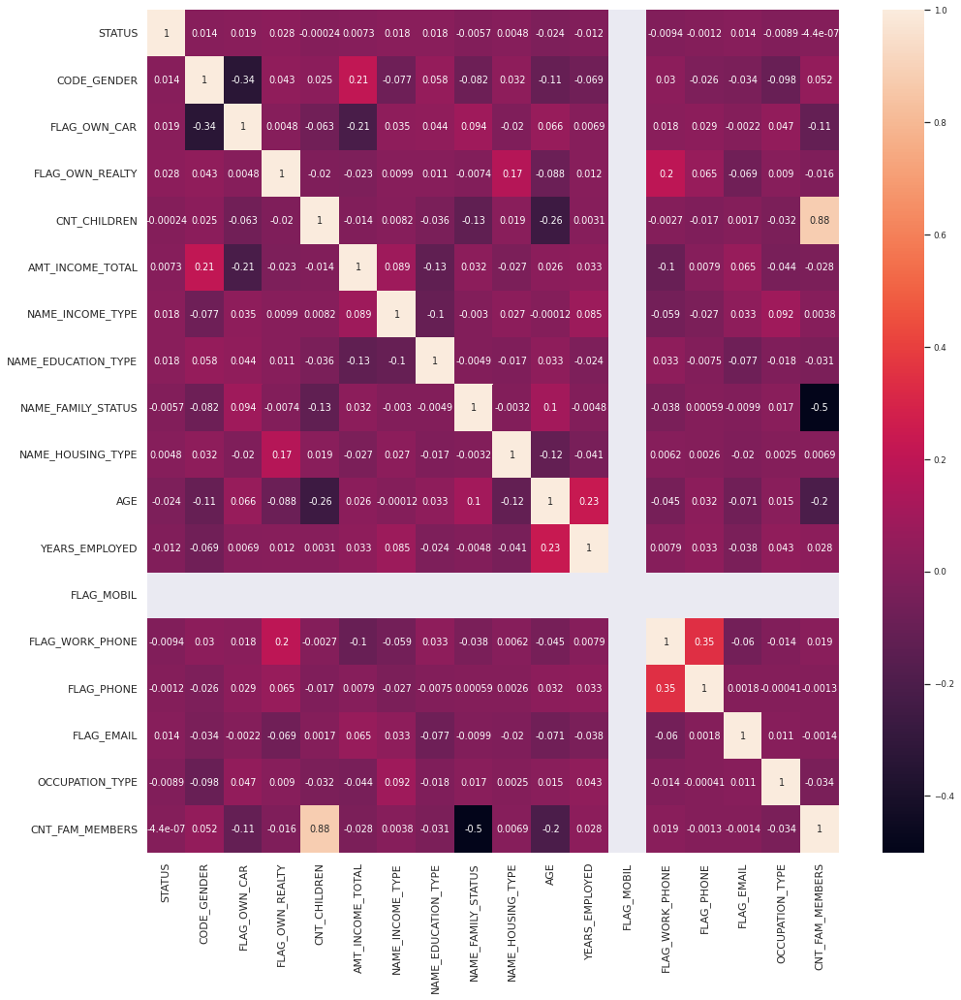

In [ ]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.set(font_scale=0.8)
sns.heatmap(corr_merge_record.corr(), annot=True)


#### Variables con mayor correlación con la variable dependiente

- CODE_GENDER
- FLAG_OWN_CAR
- FLAG_OWN_REALTY
- AMT_INCOME_TOTAL
- NAME_EDUCATION_TYPE
- NAME_HOUSING_TYPE
- FLAG_EMAIL


##### Conclusiones
1. Es posible apreciar que la mayor cantidad de personas que se les ha aprobado la tarjeta de crédito no poseen un vehículo personal. Junto a esto es posible verificar que el nivel educacional de las personas que se les aprobó la tarjeta fue: "Secondary / secondary special". Además que estaban casadas y poseían una casa o departamento propio.
2. Para el caso de la cantidad de hijos, la media ya la desviación estandar no nos estregan una correcta información, esto se debe a que logicamente no es posible tener un 0.5 hijos. Pero, si es posible comprobar que la mayor cantidad de personas que les otorgo una tarjeta de crédito no poseen hijos.
3. Para el caso de la desviación estandar relacionado al sueldo, se puede ver si que si existe una cercanía de los datos a esta, pero también existe una tendecia a alejarse de esta. Indicando que los datos, si tiene una tendencia a estar dispersos

In [ ]:
dataFrameDecisionTree = corr_merge_record.copy()
dataFrameDecisionTree.drop(
    [ "CNT_CHILDREN","YEARS_EMPLOYED","FLAG_WORK_PHONE","FLAG_PHONE", "FLAG_MOBIL","OCCUPATION_TYPE","CNT_FAM_MEMBERS"], axis=1, inplace=True)

dataFrameDecisionTree.head()

,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,FLAG_EMAIL
2,0,1,0,0,112500.0,0,1,1,1,58.832877,0
3,0,0,1,0,270000.0,1,1,2,1,52.356164,1
4,0,0,1,0,270000.0,1,1,2,1,52.356164,1
5,0,0,1,0,270000.0,1,1,2,1,52.356164,1
6,0,0,1,0,270000.0,1,1,2,1,52.356164,1


In [ ]:
yTarget = dataFrameDecisionTree["STATUS"].values.astype('int')
X_train, X_test, y_train, y_test = train_test_split(dataFrameDecisionTree.drop(
    ['STATUS'], axis=1), yTarget, test_size=0.33, random_state=42)

tree_model = DecisionTreeClassifier(criterion='entropy',
                                    min_samples_split=20,
                                    min_samples_leaf=5,
                                    max_depth=8,
                                    class_weight={1: 7.5})
model = tree_model.fit(X_train, y_train)


In [ ]:
%pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 785 kB/s 


In [ ]:
from dtreeviz.trees import dtreeviz
# Una forma diferente de ver el arbol
viz = dtreeviz(tree_model, X_train, yTarget,
               target_name="target",
               feature_names=X_train.columns,
               class_names=["Aprobado", "No Aprobado"])

viz

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



In [ ]:
#Realizo una predicción
y_train_pred = tree_model.predict(X_train) #Prediccion en Train
y_test_pred = tree_model.predict(X_test) #Prediccion en Test

In [ ]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Train
train_accuracy = accuracy_score(y_train, y_train_pred)

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de entrenamiento: 0.6445698954781733
% de aciertos sobre el set de evaluación: 0.6291420789832047


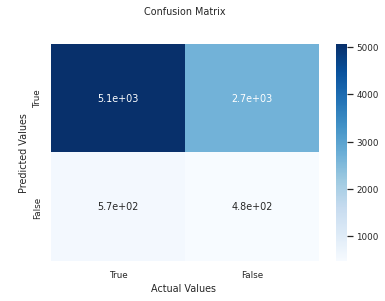

In [ ]:

# X_train, X_test, y_train, y_test
confusionMatrixResult = confusion_matrix(y_test, y_test_pred)
ax = sns.heatmap(confusionMatrixResult, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix\n\n')
ax.set_ylabel('\nPredicted Values')
ax.set_xlabel('Actual Values ')

# Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['True', 'False'])
ax.yaxis.set_ticklabels(['True', 'False'])

# Display the visualization of the Confusion Matrix.
plt.show()
# plt.savefig('decisionTreePLT.png', dpi=1200)


In [ ]:
tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
accuracy = (tp+tn)/(tn + fp + fn + tp)
especify = tn/(tn+fp)
f1_score = 2*(recall*precision)/(recall + precision)
print(precision, recall, especify, accuracy, f1_score)


0.1497005988023952 0.45454545454545453 0.6526329342088323 0.6291420789832047 0.2252252252252252


# Creación Variables Sintéticas

In [ ]:
var_corr_merge_record = corr_merge_record.copy()
var_corr_merge_record.insert(2, "AMT_INCOME_TOTAL x Family member", corr_merge_record['AMT_INCOME_TOTAL']/corr_merge_record["CNT_FAM_MEMBERS"], allow_duplicates=True)
var_corr_merge_record.head()

,STATUS,CODE_GENDER,AMT_INCOME_TOTAL x Family member,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,0,1,56250.0,0,0,0,112500.0,0,1,1,1,58.832877,3.106849,1,0,0,0,0,2.0
3,0,0,270000.0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
4,0,0,270000.0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
5,0,0,270000.0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0
6,0,0,270000.0,1,0,0,270000.0,1,1,2,1,52.356164,8.358904,1,0,1,1,1,1.0


Variables sintéticas generadas:

* AGE.

* YEARS_EMPLOYED

* AMT_INCOME_TOTAL x Family member

# PCA

In [ ]:
#Preprocesamiento
Y = var_corr_merge_record["STATUS"]
X = var_corr_merge_record.copy()
X.drop(["STATUS","CODE_GENDER","FLAG_WORK_PHONE","FLAG_OWN_CAR","FLAG_OWN_REALTY","NAME_INCOME_TYPE","NAME_EDUCATION_TYPE","NAME_FAMILY_STATUS","NAME_HOUSING_TYPE","FLAG_PHONE", "FLAG_MOBIL","FLAG_EMAIL","OCCUPATION_TYPE"], axis=1, inplace=True)
X.head()


,AMT_INCOME_TOTAL x Family member,CNT_CHILDREN,AMT_INCOME_TOTAL,AGE,YEARS_EMPLOYED,CNT_FAM_MEMBERS
2,56250.0,0,112500.0,58.832877,3.106849,2.0
3,270000.0,0,270000.0,52.356164,8.358904,1.0
4,270000.0,0,270000.0,52.356164,8.358904,1.0
5,270000.0,0,270000.0,52.356164,8.358904,1.0
6,270000.0,0,270000.0,52.356164,8.358904,1.0


In [ ]:
#Separamos en train y test
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [ ]:
#Normalizamos los datos para que PCA funcione mejor!
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
#Aplicacion de PCA
from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [ ]:
#Análisis de la varianza explicada para cada componente
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.41694184, 0.22099829, 0.19742327, 0.11876923, 0.03993959,
       0.00592779])

In [ ]:
tree_model = DecisionTreeClassifier(criterion='entropy',
                                    min_samples_split=20,
                                    min_samples_leaf=5,
                                    max_depth=8,
                                    class_weight={1: 7.5})
model = tree_model.fit(X_train, Y_train)

In [ ]:
#Realizo una predicción
Y_train_pred = tree_model.predict(X_train) #Prediccion en Train
Y_test_pred = tree_model.predict(X_test) #Prediccion en Test

In [ ]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Train
train_accuracy = accuracy_score(Y_train, Y_train_pred)

#Calculo el accuracy en Test
test_accuracy = accuracy_score(Y_test, Y_test_pred)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de entrenamiento: 0.3160284617545174
% de aciertos sobre el set de evaluación: 0.2980715221868564


Insight:
LOs resultados arrojados por el uso del PCA son inferiores en cuanto a accuracy si comparamos el resultado obtenido por modelo arbol de desición realizado originalmente.


# Comparación de Modelos de Machine Learning

In [ ]:
%pip install lightgbm

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
%pip install xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
# from xgboost.sklearn import XGBClassifier
from sklearn.neural_network import MLPClassifier

## Cambiando tipo de datos

In [ ]:
dataToCompareModels = corr_merge_record.copy()
dataToCompareModels["AGE"] = dataToCompareModels["AGE"].astype('int64')
dataToCompareModels["CNT_FAM_MEMBERS"] = dataToCompareModels["CNT_FAM_MEMBERS"].astype('int64')
dataToCompareModels.head()

,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,AGE,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
2,0,1,0,0,0,112500.0,0,1,1,1,58,3.106849,1,0,0,0,0,2
3,0,0,1,0,0,270000.0,1,1,2,1,52,8.358904,1,0,1,1,1,1
4,0,0,1,0,0,270000.0,1,1,2,1,52,8.358904,1,0,1,1,1,1
5,0,0,1,0,0,270000.0,1,1,2,1,52,8.358904,1,0,1,1,1,1
6,0,0,1,0,0,270000.0,1,1,2,1,52,8.358904,1,0,1,1,1,1


## Desglozando data

In [ ]:
X = dataToCompareModels.drop(['STATUS'], axis=1)
y = dataToCompareModels['STATUS']

X.shape, y.shape


((26703, 17), (26703,))

## Creando modelos

In [ ]:
seed = 123
model1 = LogisticRegression(max_iter=10000)
model2 = SVC(random_state=seed)
model3 = GaussianNB()
model4 = MLPClassifier(random_state=seed, max_iter=500)
model5 = SGDClassifier(random_state=seed)
model6 = KNeighborsClassifier()
model7 = DecisionTreeClassifier(random_state=seed)
model8 = RandomForestClassifier(random_state=seed, class_weight="balanced")
model9 = GradientBoostingClassifier(random_state=seed)
model10 = LGBMClassifier(random_state=seed)


## Operando con modelos

### Cross-Validations

In [ ]:
from sklearn.model_selection import cross_val_score

models = [model1, model2, model3, model4, model5, model6, model7,
          model8, model9, model10]
# max 3 , 9, 10

for m in range(len(models)):
    model = models[m]
    scores = cross_val_score(model, X, y, scoring='roc_auc', cv=5)
    print(f"For no of trees {m+1} - {np.mean(scores)}")


For no of trees 1 - 0.5103373120051706
For no of trees 2 - 0.5022262429846279
For no of trees 3 - 0.5181178910007825
For no of trees 4 - 0.4908825902215391
For no of trees 5 - 0.4892187633158496
For no of trees 6 - 0.5051542940265266
For no of trees 7 - 0.5049278914493602
For no of trees 8 - 0.5055085596049886
For no of trees 9 - 0.5180437703524439
For no of trees 10 - 0.5121050993899177


### Trabajando sobre los mejores promedios

1. LGBMClassifier
2. GradientBoostingClassifier
3. GaussianNB

Se genera a partir de los splits de cross validations entrenamientos y predicciones de los modelos, con el fin de obtener una comparativa y porcentaje de relación entre los algoritmos de machin learning

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

kfold = 10
skf = StratifiedKFold(n_splits=kfold, shuffle=True)

X1 = np.array(X)
y1 = np.array(y)
scores = []

for i, (train_index, test_index) in enumerate(skf.split(X1, y1)):
    print('[Fold %d/%d]' % (i + 1, kfold))
    X_train, X_valid = X1[train_index], X1[test_index]
    y_train, y_valid = y1[train_index], y1[test_index]

    model10 = LGBMClassifier(random_state=123)
    model10.fit(X_train, y_train)
    y_pred1 = pd.DataFrame(model10.predict_proba(X_valid))[1].values

    model9 = GradientBoostingClassifier(loss='log_loss', random_state=123)
    model9.fit(X_train, y_train)
    y_pred2 = pd.DataFrame(model9.predict_proba(X_valid))[1].values

    model3 = GaussianNB()
    model3.fit(X_train, y_train)
    y_pred3 = pd.DataFrame(model3.predict_proba(X_valid))[1].values

    y_pred = 0.60 * y_pred1 + 0.25 * y_pred2 + 0.15 * y_pred3
    # y_pred_final = 0.60 * y_pred_test10 + 0.25 * y_pred_test9 + 0.15 * y_pred_test3

    score = roc_auc_score(y_valid, y_pred)
    y_pred_label = np.where(y_pred < 0.5, 0, 1)
    # print(classification_report(y_valid, y_pred_label, zero_division=1))
    scores.append(score)

    print(f'Fold {i + 1}/{kfold} - Score: {score}')

print(f"Avg scores - {np.mean(scores)}")


[Fold 1/10]
Fold 1/10 - Score: 0.7340739313058273
[Fold 2/10]
Fold 2/10 - Score: 0.7394486388770736
[Fold 3/10]
Fold 3/10 - Score: 0.7269918385793279
[Fold 4/10]
Fold 4/10 - Score: 0.6927606341062098
[Fold 5/10]
Fold 5/10 - Score: 0.7192550625425851
[Fold 6/10]
Fold 6/10 - Score: 0.7354640957446807
[Fold 7/10]
Fold 7/10 - Score: 0.7356589095744681
[Fold 8/10]
Fold 8/10 - Score: 0.727001329787234
[Fold 9/10]
Fold 9/10 - Score: 0.6963025265957445
[Fold 10/10]
Fold 10/10 - Score: 0.7141170212765957
Avg scores - 0.7221073988389747


### Operando con los 3 modelos

Clasificación realizada para el data set completo.

Esto permite obtener la probabilidad que la se puede categorizar efectivamente.


In [ ]:
x_test = np.array(dataToCompareModels.drop('STATUS', axis=1))
y_pred_test3 = pd.DataFrame(model3.predict_proba(x_test))[1].values
y_pred_test9 = pd.DataFrame(model9.predict_proba(x_test))[1].values
y_pred_test10 = pd.DataFrame(model10.predict_proba(x_test))[1].values
y_pred_final = 0.65 * y_pred_test10 + 0.25 * y_pred_test9 + 0.10 * y_pred_test3


## Analizando resultados de algoritmos

In [ ]:
def describeNumpy(arrayIn):

    r1 = np.mean(arrayIn)
    print("Mean: ", r1)

    r2 = np.std(arrayIn)
    print("std: ", r2)

    r3 = np.var(arrayIn)
    print("Variance: ", r3)


### Predicción para el modelo GaussianNB

In [ ]:
describeNumpy(y_pred_test3)

Mean:  0.11892817888553323
std:  0.011182334621785778
Variance:  0.00012504460759358888


### Predicción para el modelo GradientBoostingClassifier

In [ ]:
describeNumpy(y_pred_test9)

Mean:  0.1196948789646884
std:  0.0395575716019115
Variance:  0.001564801471040355


### Predicción para el modelo LGBMClassifier

In [ ]:
describeNumpy(y_pred_test10)

Mean:  0.11953807182548151
std:  0.08280963439621038
Variance:  0.00685743554883403


In [ ]:
# sort_values( by=["STATUS"], ascending=False)
submission = pd.DataFrame({'STATUS': y_pred_final})
submission.describe()


,STATUS
count,26703.000000
mean,0.119516
std,0.060754
min,0.027346
25%,0.087327
50%,0.106697
75%,0.130669
max,0.776866


## Conclusiones

* Es posible apreciar que en comparativa de los podemos existen 3 que resalta a la hora de efectuar una correcta categorización.

* En los 3 de los modelos existe una baja desviación estandar, permitiendo entender que no existe una gran dispersión de los datos, por lo que los modelos clasificaron de una manera uniforme, sin tanta diferencia.

* A pesar de poseer una desviación estandar el promedio de categorización es bajo. Por lo que la probablidad de etiquetar correctamente será baja

* Respecto a la probabilidad promediada de donde se presenta anteriormente, la probabilidad mínima es muy baja para considerar en un futuro, y el 75% supera el 13% lo cual sigue siendo bajo.Pero se mantiene la desviación estable.


# Bias-Variance Trade Off


En base a los datos obtenidos de los modelos del desafio anterior, ya poseemos la varianza y el bias para hacer el calculo correspondiente y saber cual es el modelo mejor ajustado.

In [1]:
#model10
var10= 0.00685743554883403

bias10= 0.0886623994331228

bvto10= var10 + bias10 **2

bvto10

0.014718456622072645

In [2]:
#model3
var3= 0.00012504460759358888

bias3= 0.09531791631950973

bvto3= var3 + bias3 **2

bvto3

0.009210549779086648

##Conclusiones

El modelo 3 es mejor en cuanto a presicion ya que tiene un error final significativamente menor al modelo 10.